In [52]:
from __future__ import print_function
#%matplotlib inline
import argparse
import glob
import os
import scipy.misc
import time
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as tvdset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [53]:
#Root directory for dataset
dataroot = '/home/amitkad/data'
imgroot = os.path.join(dataroot, 'figs')

arch = ['triple-gan', 'nzsg']
arch_ind = 1

dset = ['CIFAR', 'MNIST', 'vg2monet', 'photo']
dset_ind = 3

modelroot = os.path.join('model', dset[dset_ind])

# training parameters
load = False
workers = 2
batch_size = 64
num_epochs = 100
beta1 = 0.5
ngpu = 1
lr = 1e-5
lrC= 1e-4

# model parameters
n_classes = 2
image_size = 128
nc = 3
img_shape = (nc, image_size, image_size)
ngf = 128
ncf = 6

In [54]:
def make_weights_for_balanced_classes(images, nclasses):
    count = [0] * nclasses
    for item in images:
        count[item[1]] += 1
    weight_per_class = [0.] * nclasses
    N = float(sum(count))
    for i in range(nclasses):
        weight_per_class[i] = N/float(count[i])
    weight = [0] * len(images)
    for idx, val in enumerate(images):
        weight[idx] = weight_per_class[val[1]]
    return weight


In [55]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = tvdset.ImageFolder(os.path.join(dataroot, dset[2]), transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                           ]))

dataset2 = tvdset.ImageFolder(os.path.join(dataroot, dset[3]), transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                           ]))

# For unbalanced dataset we create a weighted sampler
weights = make_weights_for_balanced_classes(dataset.imgs, len(dataset.classes))
weights = torch.DoubleTensor(weights)
sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, len(weights))


# trainset, valset = torch.utils.data.random_split(dataset, [50000, 10000])
# Create the dataloader
trainloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         sampler=sampler, shuffle=False, num_workers=workers, drop_last=True)

trainloader2 = torch.utils.data.DataLoader(dataset2, batch_size=batch_size, shuffle=True, num_workers=workers,
                                           drop_last=True)
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [56]:
# Get most recent model parameters
if load:
    model_files = glob.glob(os.path.join(modelroot, '*'))
    model_ind = 0
    most_recent = 0
    for i, file in enumerate(model_files):
        mod_time = int(file.split('/')[-1])
        if mod_time > most_recent:
            most_recent = mod_time
            model_ind = i
    model_file = model_files[model_ind]

In [57]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

def deconv(c_in, c_out, k_size, stride=2, pad=1, bn=True):
    """Custom deconvolutional layer for simplicity."""
    layers = []
    layers.append(nn.ConvTranspose2d(c_in, c_out, k_size, stride, pad, bias=False))
    if bn:
        layers.append(nn.BatchNorm2d(c_out))
    return nn.Sequential(*layers)

def conv(c_in, c_out, k_size, stride=2, pad=1, bn=True):
    """Custom convolutional layer for simplicity."""
    layers = []
    layers.append(nn.Conv2d(c_in, c_out, k_size, stride, pad, bias=False))
    if bn:
        layers.append(nn.BatchNorm2d(c_out))
    return nn.Sequential(*layers)


In [58]:
class G(nn.Module):
    """Generator for transfering from mnist to svhn"""
    def __init__(self, conv_dim=ngf):
        super(G, self).__init__()

        self.label_emb = nn.Embedding(n_classes, 1)
        # encoding blocks
        self.conv1 = conv(4, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4)

        # residual blocks
        self.conv3 = conv(conv_dim*2, conv_dim*2, 3, 1, 1)
        self.conv4 = conv(conv_dim*2, conv_dim*2, 3, 1, 1)

        # decoding blocks
        self.deconv1 = deconv(conv_dim*2, conv_dim, 4)
        self.deconv2 = deconv(conv_dim, 3, 4, bn=False)

    def forward(self, x, y):
        emb = self.label_emb(y)
        emb = emb.unsqueeze(1).unsqueeze(1)
        out = F.leaky_relu(self.conv1(torch.cat((x, emb.repeat(1, 1, image_size, image_size)), dim=1)), 0.05)      # (?, 64, 16, 16)
        out = F.leaky_relu(self.conv2(out), 0.05)    # (?, 128, 8, 8)

        out = F.leaky_relu(self.conv3(out), 0.05)    # ( " )
        out = F.leaky_relu(self.conv4(out), 0.05)    # ( " )

        out = F.leaky_relu(self.deconv1(out), 0.05)  # (?, 64, 16, 16)
        out = F.tanh(self.deconv2(out))              # (?, 3, 32, 32)
        return out

# Create the generator
netG = G().to(device)
netGC = G().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
if load:
    netG.load_state_dict(torch.load(os.path.join(model_file, 'g.pt')))
    netG.load_state_dict(torch.load(os.path.join(model_file, 'gc.pt')))
else:
    netG.apply(weights_init)
    netGC.apply(weights_init)

In [59]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.label_embedding = nn.Embedding(n_classes, n_classes)

        self.model = nn.Sequential(
            nn.Linear(n_classes + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity

class Discriminator2(nn.Module):
    def __init__(self):
        super(Discriminator2, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        # Concatenate label embedding and image to produce input
        validity = self.model(img.view(img.size(0), -1))
        return validity

# Create the Discriminator
netD = Discriminator().to(device)
netDC = Discriminator2().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
if load:
    netD.load_state_dict(torch.load(os.path.join(model_file, 'd.pt')))
    netDC.load_state_dict(torch.load(os.path.join(model_file, 'dc.pt')))
else:
    netD.apply(weights_init)
    netDC.apply(weights_init)

In [60]:
class Classifier(nn.Module):
    def __init__(self, ngpu):
        self.ngpu = ngpu
        super(Classifier, self).__init__()
        self.conv1 = nn.Conv2d(nc, ncf, 5)
        self.pool = nn.MaxPool2d(5, 5)
        self.conv2 = nn.Conv2d(ncf, 16, 5)
        self.fc1 = nn.Linear(16 * 4 * 4, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, n_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 4 * 4)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Create the Classifier
netC = Classifier(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
if load:
    netC.load_state_dict(torch.load(os.path.join(model_file, 'c.pt')))
else:
    netC.apply(weights_init)

In [61]:
# Initialize BCELoss function
criterion = nn.BCELoss()
criterion_class = nn.CrossEntropyLoss()
criterion_cyc = nn.L1Loss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
reps = 5
fixed_class = torch.arange(start=0, end=n_classes, dtype=torch.long, device=device).repeat(reps)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerDC = optim.Adam(netDC.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerGC = optim.Adam(netGC.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerC = optim.Adam(netC.parameters(), lr=lrC, betas=(beta1, 0.999))
schedulerC = torch.optim.lr_scheduler.StepLR(optimizerC, step_size=num_epochs / 3, gamma=0.5)
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=num_epochs / 3, gamma=0.5)
schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=num_epochs / 3, gamma=0.5)

In [ ]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
C_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    acc_Y = 0
    acc_G = 0
    # For each batch in the dataloader
    for i, (data, photo_data) in enumerate(zip(trainloader, trainloader2), 0):
        real_photo = photo_data[0].to(device)
        real_paint = data[0].to(device)
        real_class = data[1].to(device)
        fake_paint = netG(real_photo, real_class)
        fake_photo = netGC(real_paint, real_class)
        fake_class = netC(real_paint)
        b_size = real_paint.size(0)
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netD.zero_grad()
        label = torch.full((b_size,), real_label, device=device)
        output = netD(real_paint, real_class).view(-1)
        errD_X = criterion(output, label)
        errD_X.backward()
        D_X = output.mean().item()

        # Train with all-fake batch
        label.fill_(fake_label)
        output = netD(fake_paint.detach(), real_class).view(-1)
        errD_G = criterion(output, label)
        errD_G.backward()
        D_G = output.mean().item()

        # Generate fake class batch with C
        output = netD(real_paint, torch.argmax(fake_class, dim=1)).view(-1)
        errD_C = criterion(output, label)
        errD_C.backward()
        D_C = output.mean().item()

        # Add the gradients from the all-real and all-fake batches
        errD = errD_X + errD_G + errD_C
        optimizerD.step()

          ############################
        # (2) Update C network
        ###########################
        netC.zero_grad()
        errC_Y = criterion_class(fake_class, real_class)
        errC_Y.backward()
        acc_Y += (torch.argmax(fake_class, dim=1)==real_class).type(torch.cuda.FloatTensor).mean()

        ## Train with discriminator
        label.fill_(real_label)  # fake labels are real for classifier cost
        output = netD(real_paint, torch.argmax(fake_class, dim=1)).view(-1)
        errC_D = criterion(output, label)
        errC_D.backward()

        # Train with generator
        gen_class = netC(fake_paint.detach())
        errC_G = 0.5 * criterion_class(gen_class, real_class)
        errC_G.backward()
        acc_G += (torch.argmax(gen_class, dim=1)==real_class).type(torch.cuda.FloatTensor).mean()

        errC = errC_Y + errC_D + errC_G
        optimizerC.step()

        ############################
        # (3) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake_paint, real_class).view(-1)
        errG_D = criterion(output, label)
        errG_D.backward()

        fake_paint = netG(real_photo, real_class)
        gen_class = netC(fake_paint)
        errG_C = -0.5 * criterion_class(gen_class, real_class)
        errG_C.backward()

        cycle_paint = netG(fake_photo.detach(), real_class)
        errG_GC = criterion_cyc(cycle_paint, real_paint)
        errG_GC.backward()

        errG = errG_D + errG_C + errG_GC
        optimizerG.step()

        ############################
        # (4) Update D_cyc network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netDC.zero_grad()
        label = torch.full((b_size,), real_label, device=device)
        output = netDC(real_photo).view(-1)
        errDC_X = criterion(output, label)
        errDC_X.backward()
        DC_X = output.mean().item()

        # Train with all-fake batch
        label.fill_(fake_label)
        output = netDC(fake_photo.detach()).view(-1)
        errDC_G = criterion(output, label)
        errDC_G.backward()
        DC_G = output.mean().item()

        # Add the gradients from the all-real and all-fake batches
        errDC = errDC_X + errDC_G
        # Update D
        optimizerDC.step()

        ############################
        # (5) Update G_cyc network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netDC(fake_photo).view(-1)
        errGC_D = criterion(output, label)
        errGC_D.backward()

        cycle_photo = netGC(fake_paint.detach(), real_class)
        errGC_G = criterion_cyc(cycle_photo, real_photo)
        errGC_G.backward()

        errGC = errGC_D + errGC_G
        optimizerGC.step()

        # Output training stats
        if i % 20 == 1:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tLoss_C: %.4f\tD(x,y): %.4f\tD(G(z,y),y): %.4f\nD(x,C(x)): %.4f\tC(y): %.4f\tC(G(z,y)): %.4f\tDC(x): %.4f\tDC(G(z)): %.4f'
                  % (epoch, num_epochs, i, len(trainloader),
                     errD.item(), errG.item(), errC.item(), D_X, D_G, D_C, acc_Y / (i + 1), acc_G / (i + 1), DC_X, DC_G))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        C_losses.append(errC.item())



        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 300 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                fake = netG(real_paint[:reps * n_classes], fixed_class).detach().cpu()
            img_list.append(vutils.make_grid(fake, nrow=10, padding=2, normalize=True))

        iters += 1
    schedulerC.step()
    schedulerG.step()
    schedulerD.step()

Starting Training Loop...
[0/100][1/31]	Loss_D: 2.0465	Loss_G: 0.8555	Loss_C: 1.7678	D(x,y): 0.4856	D(G(z,y),y): 0.4798
D(x,C(x)): 0.4885	C(y): 0.5469	C(G(z,y)): 0.5469	DC(x): 0.5303	DC(G(z)): 0.4825
[0/100][21/31]	Loss_D: 2.0090	Loss_G: 0.8690	Loss_C: 1.7934	D(x,y): 0.4832	D(G(z,y),y): 0.4579
D(x,C(x)): 0.4843	C(y): 0.4986	C(G(z,y)): 0.4986	DC(x): 0.9114	DC(G(z)): 0.2873
[1/100][1/31]	Loss_D: 1.9986	Loss_G: 0.8959	Loss_C: 1.7821	D(x,y): 0.4671	D(G(z,y),y): 0.4501
D(x,C(x)): 0.4680	C(y): 0.5312	C(G(z,y)): 0.5312	DC(x): 0.9414	DC(G(z)): 0.2931
[1/100][21/31]	Loss_D: 2.0319	Loss_G: 0.8555	Loss_C: 1.7830	D(x,y): 0.4672	D(G(z,y),y): 0.4654
D(x,C(x)): 0.4705	C(y): 0.5376	C(G(z,y)): 0.5007	DC(x): 0.8904	DC(G(z)): 0.3775
[2/100][1/31]	Loss_D: 2.0145	Loss_G: 0.7906	Loss_C: 1.8240	D(x,y): 0.4792	D(G(z,y),y): 0.4624
D(x,C(x)): 0.4790	C(y): 0.5703	C(G(z,y)): 0.4531	DC(x): 0.9182	DC(G(z)): 0.3562
[2/100][21/31]	Loss_D: 1.9995	Loss_G: 0.8375	Loss_C: 1.8607	D(x,y): 0.4443	D(G(z,y),y): 0.4496
D(x,C(x

[23/100][21/31]	Loss_D: 1.9553	Loss_G: 0.6792	Loss_C: 1.8789	D(x,y): 0.3942	D(G(z,y),y): 0.4056
D(x,C(x)): 0.3865	C(y): 0.6193	C(G(z,y)): 0.5277	DC(x): 0.9967	DC(G(z)): 0.0040
[24/100][1/31]	Loss_D: 1.9815	Loss_G: 0.6384	Loss_C: 1.6718	D(x,y): 0.3776	D(G(z,y),y): 0.3976
D(x,C(x)): 0.3847	C(y): 0.6328	C(G(z,y)): 0.4922	DC(x): 0.9998	DC(G(z)): 0.0053
[24/100][21/31]	Loss_D: 1.9594	Loss_G: 0.6917	Loss_C: 1.8389	D(x,y): 0.4038	D(G(z,y),y): 0.4111
D(x,C(x)): 0.4010	C(y): 0.6598	C(G(z,y)): 0.4950	DC(x): 1.0000	DC(G(z)): 0.0109
[25/100][1/31]	Loss_D: 1.9625	Loss_G: 0.7116	Loss_C: 1.7777	D(x,y): 0.3851	D(G(z,y),y): 0.3953
D(x,C(x)): 0.3876	C(y): 0.6094	C(G(z,y)): 0.5000	DC(x): 0.9988	DC(G(z)): 0.0053
[25/100][21/31]	Loss_D: 1.9738	Loss_G: 0.7348	Loss_C: 1.9603	D(x,y): 0.4179	D(G(z,y),y): 0.4144
D(x,C(x)): 0.4254	C(y): 0.6428	C(G(z,y)): 0.5163	DC(x): 0.9973	DC(G(z)): 0.0029
[26/100][1/31]	Loss_D: 1.9722	Loss_G: 0.6663	Loss_C: 1.8020	D(x,y): 0.3725	D(G(z,y),y): 0.3937
D(x,C(x)): 0.3747	C(y): 0.6

In [ ]:
# save models
mod_time = str(time.time()).split('.')[0]
if not os.path.exists(modelroot):
    os.mkdir(modelroot)
torch.save(netD.state_dict(), os.path.join(modelroot, arch[arch_ind] + '_' + mod_time + '_d.pt'))
torch.save(netG.state_dict(), os.path.join(modelroot, arch[arch_ind] + '_' + mod_time + '_g.pt'))
torch.save(netC.state_dict(), os.path.join(modelroot, arch[arch_ind] + '_' + mod_time + '_c.pt'))
torch.save(netDC.state_dict(), os.path.join(modelroot, arch[arch_ind] + '_' + mod_time + '_dc.pt'))
torch.save(netGC.state_dict(), os.path.join(modelroot, arch[arch_ind] + '_' + mod_time + '_gc.pt'))

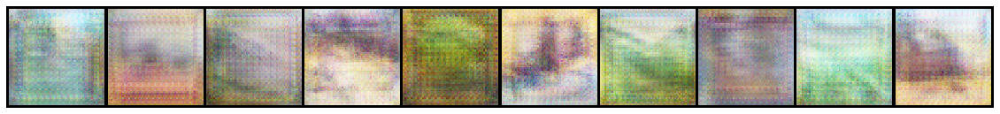

In [14]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
real_batch = next(iter(trainloader2))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))
print('label:', real_batch[1])

netG.eval()
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("net Images")
fake_img = netG(real_batch[0].to(device)[:16], real_batch[1].to(device)[:16])
plt.imshow(np.transpose(vutils.make_grid(fake_img.detach(), padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
testset = tvdset.MNIST(dataroot,download=True, train=False, transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                           ]))
testloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

correct = 0
total = 0
four_nine = 0
tot_four = 0
predicted_bin = torch.zeros(n_classes)
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.to(device)
        labels = labels.to(device)
        outputs = netC(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))